In [7]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [8]:
# Load the dataset
file_path = "YINN_A50_futures.xlsx"

# Load the "Combined" sheet
df = pd.read_excel(file_path, sheet_name="Combined")

# Ensure the date column is in datetime format
df['Date'] = pd.to_datetime(df['Date'])

In [9]:
#Compute moving averages
df['MA_10'] = df['China A50 Price'].rolling(window=10).mean()
df['MA_20'] = df['China A50 Price'].rolling(window=20).mean()
df['MA_50'] = df['China A50 Price'].rolling(window=50).mean()
df['MA_100'] = df['China A50 Price'].rolling(window=100).mean()
df['MA_120'] = df['China A50 Price'].rolling(window=120).mean()
df['MA_150'] = df['China A50 Price'].rolling(window=150).mean()
df['MA_200'] = df['China A50 Price'].rolling(window=200).mean()

In [20]:
# Revised Logic 1.0 for Fixed Notional Approach (t+1 execution)
initial_investment = 1000
results = {}

for ma in ['MA_10','MA_20','MA_50','MA_100', 'MA_120', 'MA_150','MA_200']:
    df_copy = df.copy()
    df_copy.sort_values(by='Date', inplace=True)  # Ensure data is sorted chronologically

    # Initialize columns for strategy
    df_copy['Signal'] = 0         # 1 = Buy, -1 = Sell, 0 = Hold
    df_copy['Position'] = 0       # 1 = In Trade, 0 = Out of Trade
    df_copy['Trade_Price'] = np.nan   # Entry/Exit Price
    df_copy['Trailing_Stop'] = np.nan # Trailing Stop Price
    # For a fixed notional approach, the portfolio value isn't used to size trades.
    # It may still be updated to track performance.
    df_copy['Portfolio_Value'] = initial_investment

    in_trade = False
    pending_buy = False       # Flag for buy signal pending execution
    pending_buy_idx = None    # The index (row) where the buy signal was generated
    pending_exit = False      # Flag for exit signal pending execution
    pending_exit_idx = None   # The index where the exit signal was generated

    # Trade-specific variables
    trade_price = 0
    shares_held = 0
    trailing_stop = 0
    entry_date = None

    # Hold period (in days)
    hold_period = 3  # Subject to change

    # Loop over each row except the last (since we need next day's open for execution)
    for i in range(len(df_copy) - 1):
        current_date = df_copy['Date'].iloc[i]
        current_close = df_copy['YINN US Price'].iloc[i]
        current_low = df_copy['YINN US Low'].iloc[i]
        current_high = df_copy['YINN US High'].iloc[i]
        next_open = df_copy['YINN US Open'].iloc[i + 1]

        print("\n---")
        print(f"Index: {i}, Date: {current_date}")
        print(f"Current Close: {current_close}, Current Low: {current_low}, Current High: {current_high}")
        print(f"Next Open (for execution if pending): {next_open}")

        # ----- Execute Pending Buy Order -----
        if pending_buy and i == pending_buy_idx + 1:
            print(f"Executing pending BUY order (signal generated at index {pending_buy_idx} on {df_copy['Date'].iloc[pending_buy_idx]})")
            # Execute buy order using today's open price (next_open is used)
            trade_price = next_open
            # For fixed notional, always use initial_investment to size the trade:
            shares_held = initial_investment / trade_price
            trailing_stop = trade_price * 0.90  # Set trailing stop at 10% below entry
            entry_date = df_copy['Date'].iloc[pending_buy_idx]
            df_copy.at[i, 'Signal'] = 1
            df_copy.at[i, 'Trade_Price'] = trade_price
            # Update portfolio value after buy execution (position value)
            df_copy.at[i, 'Portfolio_Value'] = shares_held * trade_price
            in_trade = True
            pending_buy = False
            print(f"BUY EXECUTED: Trade Price = {trade_price}, Shares Held = {shares_held}, New Trailing Stop = {trailing_stop}")
            print(f"Portfolio Value updated to {df_copy.at[i, 'Portfolio_Value']}")

        # ----- Execute Pending Exit Order -----
        if pending_exit and i == pending_exit_idx + 1:
            print(f"Executing pending EXIT order (signal generated at index {pending_exit_idx} on {df_copy['Date'].iloc[pending_exit_idx]})")
            exit_price = next_open
            trade_return = (exit_price - trade_price) / trade_price
            df_copy.at[i, 'Signal'] = -1
            df_copy.at[i, 'Trade_Price'] = exit_price
            df_copy.at[i, 'Trade_Return'] = trade_return
            # Update portfolio value after exit (this becomes the result of that trade)
            df_copy.at[i, 'Portfolio_Value'] = shares_held * exit_price
            print(f"SELL EXECUTED: Exit Price = {exit_price}, Trade Return = {trade_return}, New Portfolio Value = {df_copy.at[i, 'Portfolio_Value']}")
            shares_held = 0
            in_trade = False
            pending_exit = False

        # ----- Signal Generation (only if not in trade or pending a buy order) -----
        if (not in_trade) and (not pending_buy):
            if df_copy['China A50 Price'].iloc[i] > df_copy[ma].iloc[i]:
                print(f"BUY SIGNAL GENERATED at {current_date} for {ma}. China A50 Price = {df_copy['China A50 Price'].iloc[i]}, MA = {df_copy[ma].iloc[i]}")
                pending_buy = True
                pending_buy_idx = i
                print(f"Pending BUY flagged at index {i}.")

        # ----- In-Trade Processing -----
        if in_trade:
            # Update trailing stop using current day's high (only after trade execution)
            old_trailing_stop = trailing_stop
            trailing_stop = max(trailing_stop, current_high * 0.90)
            if trailing_stop != old_trailing_stop:
                print(f"Trailing Stop updated: Old = {old_trailing_stop}, New = {trailing_stop}")
            df_copy.at[i, 'Trailing_Stop'] = trailing_stop

            # Exit Condition 1: Stop-loss triggered if intraday low falls below trailing stop
            if current_low < trailing_stop and not pending_exit:
                print(f"STOP-LOSS condition met on {current_date}. Current Low = {current_low} < Trailing Stop = {trailing_stop}")
                pending_exit = True
                pending_exit_idx = i
                print(f"Pending EXIT flagged at index {i} due to Stop-Loss.")

            # Exit Condition 2: MA exit after holding period (if not already pending exit)
            elif (entry_date is not None and 
                  (df_copy['Date'].iloc[i] - entry_date).days >= hold_period and 
                  current_close < df_copy[ma].iloc[i] * 0.98 and not pending_exit):
                print(f"MA SELL condition met on {current_date}. Holding Period reached and Current Close = {current_close} < 98% of MA = {df_copy[ma].iloc[i] * 0.98}")
                pending_exit = True
                pending_exit_idx = i
                print(f"Pending EXIT flagged at index {i} due to MA condition.")

        # ----- Portfolio Value Update -----
        # If no order is executed on this day, simply carry forward the previous day's portfolio value.
        if df_copy.at[i, 'Signal'] == 0:
            df_copy.at[i, 'Portfolio_Value'] = (df_copy.at[i - 1, 'Portfolio_Value']
                                                if i > 0 else initial_investment)

        # Debug print for the iteration end:
        print(f"End of Index {i} Summary:")
        print(f"  In Trade: {in_trade}, Pending Buy: {pending_buy}, Pending Exit: {pending_exit}")
        print(f"  Trade Price: {trade_price}, Shares Held: {shares_held}")
        print(f"  Trailing Stop: {trailing_stop}")
        print(f"  Portfolio Value: {df_copy.at[i, 'Portfolio_Value']}")
        print("---")

    # For the final row, simply carry forward the last known portfolio value.
    df_copy.at[len(df_copy) - 1, 'Portfolio_Value'] = (df_copy.at[len(df_copy) - 2, 'Portfolio_Value']
                                                        if len(df_copy) > 1 else initial_investment)
    # Calculate returns and drawdowns
    df_copy['Daily_Return'] = df_copy['Portfolio_Value'].pct_change().fillna(0)
    df_copy['Cumulative_Return'] = (1 + df_copy['Daily_Return']).cumprod() - 1
    df_copy['Rolling_Max'] = df_copy['Portfolio_Value'].cummax()
    df_copy['Drawdown'] = df_copy['Portfolio_Value'] / df_copy['Rolling_Max'] - 1

    results[ma] = df_copy



---
Index: 0, Date: 2019-01-02 00:00:00
Current Close: 338.4, Current Low: 325.6, Current High: 340.2
Next Open (for execution if pending): 328.0
End of Index 0 Summary:
  In Trade: False, Pending Buy: False, Pending Exit: False
  Trade Price: 0, Shares Held: 0
  Trailing Stop: 0
  Portfolio Value: 1000
---

---
Index: 1, Date: 2019-01-03 00:00:00
Current Close: 322.0, Current Low: 320.0, Current High: 329.2
Next Open (for execution if pending): 343.6
End of Index 1 Summary:
  In Trade: False, Pending Buy: False, Pending Exit: False
  Trade Price: 0, Shares Held: 0
  Trailing Stop: 0
  Portfolio Value: 1000
---

---
Index: 2, Date: 2019-01-04 00:00:00
Current Close: 354.4, Current Low: 341.2, Current High: 361.2
Next Open (for execution if pending): 350.6
End of Index 2 Summary:
  In Trade: False, Pending Buy: False, Pending Exit: False
  Trade Price: 0, Shares Held: 0
  Trailing Stop: 0
  Portfolio Value: 1000
---

---
Index: 3, Date: 2019-01-07 00:00:00
Current Close: 356.8, Current

C:\Users\RyanQapita\AppData\Local\Temp\ipykernel_7856\1709038909.py:73: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '1032.1910695742472' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_copy.at[i, 'Portfolio_Value'] = shares_held * exit_price


BUY EXECUTED: Trade Price = 342.4, Shares Held = 2.9205607476635516, New Trailing Stop = 308.15999999999997
Portfolio Value updated to 1000.0
MA SELL condition met on 2020-08-17 00:00:00. Holding Period reached and Current Close = 338.4 < 98% of MA = 14963.13
Pending EXIT flagged at index 408 due to MA condition.
End of Index 408 Summary:
  In Trade: True, Pending Buy: False, Pending Exit: True
  Trade Price: 342.4, Shares Held: 2.9205607476635516
  Trailing Stop: 308.15999999999997
  Portfolio Value: 1000.0
---

---
Index: 409, Date: 2020-08-18 00:00:00
Current Close: 340.8, Current Low: 336.8, Current High: 345.2
Next Open (for execution if pending): 337.8
Executing pending EXIT order (signal generated at index 408 on 2020-08-17 00:00:00)
SELL EXECUTED: Exit Price = 337.8, Trade Return = -0.013434579439252237, New Portfolio Value = 986.5654205607477
BUY SIGNAL GENERATED at 2020-08-18 00:00:00 for MA_10. China A50 Price = 15642.5, MA = 15300.0
Pending BUY flagged at index 409.
End of 

C:\Users\RyanQapita\AppData\Local\Temp\ipykernel_7856\1709038909.py:58: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '999.9999999999999' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_copy.at[i, 'Portfolio_Value'] = shares_held * trade_price



---
Index: 395, Date: 2020-07-29 00:00:00
Current Close: 304.0, Current Low: 299.2, Current High: 305.7
Next Open (for execution if pending): 292.8
End of Index 395 Summary:
  In Trade: False, Pending Buy: False, Pending Exit: False
  Trade Price: 314.6, Shares Held: 0
  Trailing Stop: 289.8
  Portfolio Value: 944.6916719643991
---

---
Index: 396, Date: 2020-07-30 00:00:00
Current Close: 295.0, Current Low: 285.8, Current High: 295.8
Next Open (for execution if pending): 292.0
End of Index 396 Summary:
  In Trade: False, Pending Buy: False, Pending Exit: False
  Trade Price: 314.6, Shares Held: 0
  Trailing Stop: 289.8
  Portfolio Value: 944.6916719643991
---

---
Index: 397, Date: 2020-07-31 00:00:00
Current Close: 287.6, Current Low: 280.0, Current High: 292.0
Next Open (for execution if pending): 296.2
End of Index 397 Summary:
  In Trade: False, Pending Buy: False, Pending Exit: False
  Trade Price: 314.6, Shares Held: 0
  Trailing Stop: 289.8
  Portfolio Value: 944.6916719643991

C:\Users\RyanQapita\AppData\Local\Temp\ipykernel_7856\1709038909.py:73: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '976.9890795631826' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_copy.at[i, 'Portfolio_Value'] = shares_held * exit_price



---
Index: 383, Date: 2020-07-13 00:00:00
Current Close: 346.8, Current Low: 345.6, Current High: 366.2
Next Open (for execution if pending): 328.8
Executing pending EXIT order (signal generated at index 382 on 2020-07-10 00:00:00)
SELL EXECUTED: Exit Price = 328.8, Trade Return = -0.15950920245398767, New Portfolio Value = 840.4907975460123
BUY SIGNAL GENERATED at 2020-07-13 00:00:00 for MA_50. China A50 Price = 15870.0, MA = 13815.3
Pending BUY flagged at index 383.
End of Index 383 Summary:
  In Trade: False, Pending Buy: True, Pending Exit: False
  Trade Price: 391.2, Shares Held: 0
  Trailing Stop: 354.42
  Portfolio Value: 840.4907975460123
---

---
Index: 384, Date: 2020-07-14 00:00:00
Current Close: 339.0, Current Low: 327.6, Current High: 342.9
Next Open (for execution if pending): 337.2
Executing pending BUY order (signal generated at index 383 on 2020-07-13 00:00:00)
BUY EXECUTED: Trade Price = 337.2, Shares Held = 2.965599051008304, New Trailing Stop = 303.48
Portfolio Val

C:\Users\RyanQapita\AppData\Local\Temp\ipykernel_7856\1709038909.py:73: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '1020.0458190148912' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_copy.at[i, 'Portfolio_Value'] = shares_held * exit_price


SELL EXECUTED: Exit Price = 356.2, Trade Return = 0.02004581901489118, New Portfolio Value = 1020.0458190148912
BUY SIGNAL GENERATED at 2019-05-29 00:00:00 for MA_100. China A50 Price = 12805.0, MA = 12451.543
Pending BUY flagged at index 101.
End of Index 101 Summary:
  In Trade: False, Pending Buy: True, Pending Exit: False
  Trade Price: 349.2, Shares Held: 0
  Trailing Stop: 322.56
  Portfolio Value: 1020.0458190148912
---

---
Index: 102, Date: 2019-05-30 00:00:00
Current Close: 358.2, Current Low: 354.2, Current High: 360.2
Next Open (for execution if pending): 347.8
Executing pending BUY order (signal generated at index 101 on 2019-05-29 00:00:00)
BUY EXECUTED: Trade Price = 347.8, Shares Held = 2.875215641173088, New Trailing Stop = 313.02000000000004
Portfolio Value updated to 1000.0
Trailing Stop updated: Old = 313.02000000000004, New = 324.18
End of Index 102 Summary:
  In Trade: True, Pending Buy: False, Pending Exit: False
  Trade Price: 347.8, Shares Held: 2.8752156411730

C:\Users\RyanQapita\AppData\Local\Temp\ipykernel_7856\1709038909.py:73: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '1109.6618357487923' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_copy.at[i, 'Portfolio_Value'] = shares_held * exit_price



---
Index: 474, Date: 2020-11-18 00:00:00
Current Close: 405.8, Current Low: 405.8, Current High: 413.6
Next Open (for execution if pending): 400.0
Executing pending BUY order (signal generated at index 473 on 2020-11-17 00:00:00)
BUY EXECUTED: Trade Price = 400.0, Shares Held = 2.5, New Trailing Stop = 360.0
Portfolio Value updated to 1000.0
Trailing Stop updated: Old = 360.0, New = 372.24
End of Index 474 Summary:
  In Trade: True, Pending Buy: False, Pending Exit: False
  Trade Price: 400.0, Shares Held: 2.5
  Trailing Stop: 372.24
  Portfolio Value: 1000.0
---

---
Index: 475, Date: 2020-11-19 00:00:00
Current Close: 405.4, Current Low: 399.6, Current High: 406.8
Next Open (for execution if pending): 408.0
End of Index 475 Summary:
  In Trade: True, Pending Buy: False, Pending Exit: False
  Trade Price: 400.0, Shares Held: 2.5
  Trailing Stop: 372.24
  Portfolio Value: 1000.0
---

---
Index: 476, Date: 2020-11-20 00:00:00
Current Close: 412.8, Current Low: 406.2, Current High: 416

C:\Users\RyanQapita\AppData\Local\Temp\ipykernel_7856\1709038909.py:73: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '933.1651954602775' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_copy.at[i, 'Portfolio_Value'] = shares_held * exit_price


SELL EXECUTED: Exit Price = 311.2, Trade Return = -0.06937799043062198, New Portfolio Value = 930.6220095693781
BUY SIGNAL GENERATED at 2020-09-08 00:00:00 for MA_150. China A50 Price = 15340.0, MA = 13944.7
Pending BUY flagged at index 423.
End of Index 423 Summary:
  In Trade: False, Pending Buy: True, Pending Exit: False
  Trade Price: 334.4, Shares Held: 0
  Trailing Stop: 317.34000000000003
  Portfolio Value: 930.6220095693781
---

---
Index: 424, Date: 2020-09-09 00:00:00
Current Close: 316.4, Current Low: 308.4, Current High: 318.0
Next Open (for execution if pending): 309.4
Executing pending BUY order (signal generated at index 423 on 2020-09-08 00:00:00)
BUY EXECUTED: Trade Price = 309.4, Shares Held = 3.2320620555914674, New Trailing Stop = 278.46
Portfolio Value updated to 1000.0
Trailing Stop updated: Old = 278.46, New = 286.2
End of Index 424 Summary:
  In Trade: True, Pending Buy: False, Pending Exit: False
  Trade Price: 309.4, Shares Held: 3.2320620555914674
  Trailing 

C:\Users\RyanQapita\AppData\Local\Temp\ipykernel_7856\1709038909.py:73: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '972.9729729729729' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_copy.at[i, 'Portfolio_Value'] = shares_held * exit_price


SELL EXECUTED: Exit Price = 360.0, Trade Return = -0.02702702702702703, New Portfolio Value = 972.9729729729729
BUY SIGNAL GENERATED at 2019-10-22 00:00:00 for MA_200. China A50 Price = 13932.5, MA = 12994.434
Pending BUY flagged at index 203.
End of Index 203 Summary:
  In Trade: False, Pending Buy: True, Pending Exit: False
  Trade Price: 370.0, Shares Held: 0
  Trailing Stop: 341.28
  Portfolio Value: 972.9729729729729
---

---
Index: 204, Date: 2019-10-23 00:00:00
Current Close: 364.4, Current Low: 359.47, Current High: 365.6
Next Open (for execution if pending): 367.8
Executing pending BUY order (signal generated at index 203 on 2019-10-22 00:00:00)
BUY EXECUTED: Trade Price = 367.8, Shares Held = 2.718868950516585, New Trailing Stop = 331.02000000000004
Portfolio Value updated to 1000.0
End of Index 204 Summary:
  In Trade: True, Pending Buy: False, Pending Exit: False
  Trade Price: 367.8, Shares Held: 2.718868950516585
  Trailing Stop: 331.02000000000004
  Portfolio Value: 1000

In [12]:
# Revised Logic 1.0 for Fixed Notional Approach (Same Day Execution)
initial_investment = 1000
results = {}

for ma in ['MA_10','MA_20','MA_50','MA_100', 'MA_120', 'MA_150','MA_200']:
    df_copy = df.copy()
    df_copy.sort_values(by='Date', inplace=True)  # Ensure data is sorted chronologically

    # Initialize columns for strategy
    df_copy['Signal'] = 0         # 1 = Buy, -1 = Sell, 0 = Hold
    df_copy['Position'] = 0       # 1 = In Trade, 0 = Out of Trade
    df_copy['Trade_Price'] = np.nan   # Entry/Exit Price
    df_copy['Trailing_Stop'] = np.nan # Trailing Stop Price
    # For a fixed notional approach, the portfolio value is fixed per trade,
    # though we still track performance.
    df_copy['Portfolio_Value'] = initial_investment

    in_trade = False
    pending_buy = False       # Flag for buy signal pending execution
    pending_buy_idx = None    # The index where the buy signal was generated
    pending_exit = False      # Flag for exit signal pending execution
    pending_exit_idx = None   # The index where the exit signal was generated

    # Trade-specific variables
    trade_price = 0
    shares_held = 0
    trailing_stop = 0
    entry_date = None

    # Hold period (in days)
    hold_period = 3  # Subject to change

    # Loop over each row (we now use the current day's open for execution)
    for i in range(len(df_copy)):
        current_date = df_copy['Date'].iloc[i]
        current_close = df_copy['YINN US Price'].iloc[i]
        current_low = df_copy['YINN US Low'].iloc[i]
        current_high = df_copy['YINN US High'].iloc[i]
        current_open = df_copy['YINN US Open'].iloc[i]

        print("\n---")
        print(f"Index: {i}, Date: {current_date}")
        print(f"Current Open: {current_open}, Close: {current_close}, Low: {current_low}, High: {current_high}")

        # ----- Execute Pending Buy Order -----
        if pending_buy:
            print(f"Executing pending BUY order (signal generated at index {pending_buy_idx} on {df_copy['Date'].iloc[pending_buy_idx]})")
            # Execute the buy order using today's open price
            trade_price = current_open
            # For fixed notional, always use the same notional amount:
            shares_held = initial_investment / trade_price
            trailing_stop = trade_price * 0.90  # Set trailing stop at 10% below entry
            entry_date = df_copy['Date'].iloc[pending_buy_idx]
            df_copy.at[i, 'Signal'] = 1
            df_copy.at[i, 'Trade_Price'] = trade_price
            # Update portfolio value to reflect the position size (should be ~$1000, ignoring fees)
            df_copy.at[i, 'Portfolio_Value'] = shares_held * trade_price
            in_trade = True
            pending_buy = False
            print(f"BUY EXECUTED: Trade Price = {trade_price}, Shares Held = {shares_held}, New Trailing Stop = {trailing_stop}")
            print(f"Portfolio Value updated to {df_copy.at[i, 'Portfolio_Value']}")

        # ----- Execute Pending Exit Order -----
        if pending_exit:
            print(f"Executing pending EXIT order (signal generated at index {pending_exit_idx} on {df_copy['Date'].iloc[pending_exit_idx]})")
            # Execute the sell order using today's open price
            exit_price = current_open
            trade_return = (exit_price - trade_price) / trade_price
            df_copy.at[i, 'Signal'] = -1
            df_copy.at[i, 'Trade_Price'] = exit_price
            df_copy.at[i, 'Trade_Return'] = trade_return
            # Update portfolio value after exit (this is the result of that trade)
            df_copy.at[i, 'Portfolio_Value'] = shares_held * exit_price
            print(f"SELL EXECUTED: Exit Price = {exit_price}, Trade Return = {trade_return}, New Portfolio Value = {df_copy.at[i, 'Portfolio_Value']}")
            shares_held = 0
            in_trade = False
            pending_exit = False

        # ----- Signal Generation (only if not in trade or pending a buy order) -----
        if (not in_trade) and (not pending_buy):
            if df_copy['China A50 Price'].iloc[i] > df_copy[ma].iloc[i]:
                print(f"BUY SIGNAL GENERATED at {current_date} for {ma}. China A50 Price = {df_copy['China A50 Price'].iloc[i]}, MA = {df_copy[ma].iloc[i]}")
                pending_buy = True
                pending_buy_idx = i
                print(f"Pending BUY flagged at index {i}.")

        # ----- In-Trade Processing -----
        if in_trade:
            # Update trailing stop using current day's high (only after trade execution)
            old_trailing_stop = trailing_stop
            trailing_stop = max(trailing_stop, current_high * 0.90)
            if trailing_stop != old_trailing_stop:
                print(f"Trailing Stop updated: Old = {old_trailing_stop}, New = {trailing_stop}")
            df_copy.at[i, 'Trailing_Stop'] = trailing_stop

            # Exit Condition 1: Stop-loss triggered if intraday low falls below trailing stop
            if current_low < trailing_stop and not pending_exit:
                print(f"STOP-LOSS condition met on {current_date}. Current Low = {current_low} < Trailing Stop = {trailing_stop}")
                pending_exit = True
                pending_exit_idx = i
                print(f"Pending EXIT flagged at index {i} due to Stop-Loss.")

            # Exit Condition 2: MA exit after holding period (if not already pending exit)
            elif (entry_date is not None and 
                  (df_copy['Date'].iloc[i] - entry_date).days >= hold_period and 
                  current_close < df_copy[ma].iloc[i] * 0.98 and not pending_exit):
                print(f"MA SELL condition met on {current_date}. Holding Period reached and Current Close = {current_close} < 98% of MA = {df_copy[ma].iloc[i] * 0.98}")
                pending_exit = True
                pending_exit_idx = i
                print(f"Pending EXIT flagged at index {i} due to MA condition.")

        # ----- Portfolio Value Update -----
        # If no order is executed on this day, carry forward the previous day's portfolio value.
       # if in_trade:
           # df_copy.at[i, 'Portfolio_Value'] = shares_held* current_close
        if df_copy.at[i, 'Signal'] == 0:
            df_copy.at[i, 'Portfolio_Value'] = (df_copy.at[i - 1, 'Portfolio_Value'] if i > 0 else initial_investment)

        # Debug print for the end of the iteration:
        print(f"End of Index {i} Summary:")
        print(f"  In Trade: {in_trade}, Pending Buy: {pending_buy}, Pending Exit: {pending_exit}")
        print(f"  Trade Price: {trade_price}, Shares Held: {shares_held}")
        print(f"  Trailing Stop: {trailing_stop}")
        print(f"  Portfolio Value: {df_copy.at[i, 'Portfolio_Value']}")
        print("---")

    # For the final row, carry forward the last known portfolio value.
    df_copy.at[len(df_copy) - 1, 'Portfolio_Value'] = (df_copy.at[len(df_copy) - 2, 'Portfolio_Value']
                                                        if len(df_copy) > 1 else initial_investment)
    # Calculate returns and drawdowns
    df_copy['Daily_Return'] = df_copy['Portfolio_Value'].pct_change().fillna(0)
    df_copy['Cumulative_Return'] = (1 + df_copy['Daily_Return']).cumprod() - 1
    df_copy['Rolling_Max'] = df_copy['Portfolio_Value'].cummax()
    df_copy['Drawdown'] = df_copy['Portfolio_Value'] / df_copy['Rolling_Max'] - 1

    results[ma] = df_copy


---
Index: 0, Date: 2019-01-02 00:00:00
Current Open: 326.2, Close: 338.4, Low: 325.6, High: 340.2
End of Index 0 Summary:
  In Trade: False, Pending Buy: False, Pending Exit: False
  Trade Price: 0, Shares Held: 0
  Trailing Stop: 0
  Portfolio Value: 1000
---

---
Index: 1, Date: 2019-01-03 00:00:00
Current Open: 328.0, Close: 322.0, Low: 320.0, High: 329.2
End of Index 1 Summary:
  In Trade: False, Pending Buy: False, Pending Exit: False
  Trade Price: 0, Shares Held: 0
  Trailing Stop: 0
  Portfolio Value: 1000
---

---
Index: 2, Date: 2019-01-04 00:00:00
Current Open: 343.6, Close: 354.4, Low: 341.2, High: 361.2
End of Index 2 Summary:
  In Trade: False, Pending Buy: False, Pending Exit: False
  Trade Price: 0, Shares Held: 0
  Trailing Stop: 0
  Portfolio Value: 1000
---

---
Index: 3, Date: 2019-01-07 00:00:00
Current Open: 350.6, Close: 356.8, Low: 346.83, High: 360.0
End of Index 3 Summary:
  In Trade: False, Pending Buy: False, Pending Exit: False
  Trade Price: 0, Shares He

C:\Users\RyanQapita\AppData\Local\Temp\ipykernel_2284\3686602009.py:57: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '1000.0000000000001' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_copy.at[i, 'Portfolio_Value'] = shares_held * trade_price


BUY EXECUTED: Trade Price = 337.2, Shares Held = 2.965599051008304, New Trailing Stop = 303.48
Portfolio Value updated to 1000.0
Trailing Stop updated: Old = 303.48, New = 305.46
End of Index 385 Summary:
  In Trade: True, Pending Buy: False, Pending Exit: False
  Trade Price: 337.2, Shares Held: 2.965599051008304
  Trailing Stop: 305.46
  Portfolio Value: 1000.0
---

---
Index: 386, Date: 2020-07-16 00:00:00
Current Open: 303.8, Close: 311.6, Low: 303.0, High: 312.4
STOP-LOSS condition met on 2020-07-16 00:00:00. Current Low = 303.0 < Trailing Stop = 305.46
Pending EXIT flagged at index 386 due to Stop-Loss.
End of Index 386 Summary:
  In Trade: True, Pending Buy: False, Pending Exit: True
  Trade Price: 337.2, Shares Held: 2.965599051008304
  Trailing Stop: 305.46
  Portfolio Value: 1000.0
---

---
Index: 387, Date: 2020-07-17 00:00:00
Current Open: 314.2, Close: 312.2, Low: 309.0, High: 315.6
Executing pending EXIT order (signal generated at index 386 on 2020-07-16 00:00:00)
SELL EX

C:\Users\RyanQapita\AppData\Local\Temp\ipykernel_2284\3686602009.py:57: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '999.9999999999999' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_copy.at[i, 'Portfolio_Value'] = shares_held * trade_price


Index: 63, Date: 2019-04-03 00:00:00
Current Open: 513.2, Close: 508.6, Low: 504.3, High: 523.2
Executing pending BUY order (signal generated at index 62 on 2019-04-02 00:00:00)
BUY EXECUTED: Trade Price = 513.2, Shares Held = 1.9485580670303972, New Trailing Stop = 461.88000000000005
Portfolio Value updated to 1000.0
Trailing Stop updated: Old = 461.88000000000005, New = 470.88000000000005
End of Index 63 Summary:
  In Trade: True, Pending Buy: False, Pending Exit: False
  Trade Price: 513.2, Shares Held: 1.9485580670303972
  Trailing Stop: 470.88000000000005
  Portfolio Value: 1000.0
---

---
Index: 64, Date: 2019-04-04 00:00:00
Current Open: 515.6, Close: 523.6, Low: 513.8, High: 524.47
Trailing Stop updated: Old = 470.88000000000005, New = 472.023
End of Index 64 Summary:
  In Trade: True, Pending Buy: False, Pending Exit: False
  Trade Price: 513.2, Shares Held: 1.9485580670303972
  Trailing Stop: 472.023
  Portfolio Value: 1000.0
---

---
Index: 65, Date: 2019-04-05 00:00:00
Curr

C:\Users\RyanQapita\AppData\Local\Temp\ipykernel_2284\3686602009.py:73: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '1058.702791461412' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_copy.at[i, 'Portfolio_Value'] = shares_held * exit_price



Current Open: 389.8, Close: 381.6, Low: 380.4, High: 391.4
BUY SIGNAL GENERATED at 2020-02-20 00:00:00 for MA_50. China A50 Price = 13925.0, MA = 13898.15
Pending BUY flagged at index 285.
End of Index 285 Summary:
  In Trade: False, Pending Buy: True, Pending Exit: False
  Trade Price: 403.2, Shares Held: 0
  Trailing Stop: 375.12
  Portfolio Value: 873.5119047619047
---

---
Index: 286, Date: 2020-02-21 00:00:00
Current Open: 385.4, Close: 380.6, Low: 379.1, High: 385.6
Executing pending BUY order (signal generated at index 285 on 2020-02-20 00:00:00)
BUY EXECUTED: Trade Price = 385.4, Shares Held = 2.5947067981318113, New Trailing Stop = 346.86
Portfolio Value updated to 1000.0
Trailing Stop updated: Old = 346.86, New = 347.04
End of Index 286 Summary:
  In Trade: True, Pending Buy: False, Pending Exit: False
  Trade Price: 385.4, Shares Held: 2.5947067981318113
  Trailing Stop: 347.04
  Portfolio Value: 1000.0
---

---
Index: 287, Date: 2020-02-24 00:00:00
Current Open: 336.6, Clo

C:\Users\RyanQapita\AppData\Local\Temp\ipykernel_2284\3686602009.py:73: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '982.5548677546426' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_copy.at[i, 'Portfolio_Value'] = shares_held * exit_price


SELL EXECUTED: Exit Price = 349.2, Trade Return = -0.017445132245357313, New Portfolio Value = 982.5548677546426
BUY SIGNAL GENERATED at 2019-05-29 00:00:00 for MA_100. China A50 Price = 12805.0, MA = 12451.543
Pending BUY flagged at index 101.
End of Index 101 Summary:
  In Trade: False, Pending Buy: True, Pending Exit: False
  Trade Price: 355.4, Shares Held: 0
  Trailing Stop: 322.56
  Portfolio Value: 982.5548677546426
---

---
Index: 102, Date: 2019-05-30 00:00:00
Current Open: 356.2, Close: 358.2, Low: 354.2, High: 360.2
Executing pending BUY order (signal generated at index 101 on 2019-05-29 00:00:00)
BUY EXECUTED: Trade Price = 356.2, Shares Held = 2.807411566535654, New Trailing Stop = 320.58
Portfolio Value updated to 999.9999999999999
Trailing Stop updated: Old = 320.58, New = 324.18
End of Index 102 Summary:
  In Trade: True, Pending Buy: False, Pending Exit: False
  Trade Price: 356.2, Shares Held: 2.807411566535654
  Trailing Stop: 324.18
  Portfolio Value: 999.9999999999

C:\Users\RyanQapita\AppData\Local\Temp\ipykernel_2284\3686602009.py:73: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '1052.7353376047313' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_copy.at[i, 'Portfolio_Value'] = shares_held * exit_price


SELL EXECUTED: Exit Price = 427.2, Trade Return = 0.052735337604731335, New Portfolio Value = 1052.7353376047313
BUY SIGNAL GENERATED at 2019-06-28 00:00:00 for MA_120. China A50 Price = 13505.0, MA = 12596.494166666667
Pending BUY flagged at index 123.
End of Index 123 Summary:
  In Trade: False, Pending Buy: True, Pending Exit: False
  Trade Price: 405.8, Shares Held: 0
  Trailing Stop: 384.84000000000003
  Portfolio Value: 1052.7353376047313
---

---
Index: 124, Date: 2019-07-01 00:00:00
Current Open: 459.4, Close: 445.0, Low: 440.8, High: 464.0
Executing pending BUY order (signal generated at index 123 on 2019-06-28 00:00:00)
BUY EXECUTED: Trade Price = 459.4, Shares Held = 2.1767522855899, New Trailing Stop = 413.46
Portfolio Value updated to 1000.0000000000001
Trailing Stop updated: Old = 413.46, New = 417.6
MA SELL condition met on 2019-07-01 00:00:00. Holding Period reached and Current Close = 445.0 < 98% of MA = 12373.270116666667
Pending EXIT flagged at index 124 due to MA co

C:\Users\RyanQapita\AppData\Local\Temp\ipykernel_2284\3686602009.py:73: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '987.4172185430464' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_copy.at[i, 'Portfolio_Value'] = shares_held * exit_price



---
Index: 249, Date: 2019-12-27 00:00:00
Current Open: 446.8, Close: 444.8, Low: 442.2, High: 449.6
Trailing Stop updated: Old = 396.90000000000003, New = 404.64000000000004
MA SELL condition met on 2019-12-27 00:00:00. Holding Period reached and Current Close = 444.8 < 98% of MA = 13350.197
Pending EXIT flagged at index 249 due to MA condition.
End of Index 249 Summary:
  In Trade: True, Pending Buy: False, Pending Exit: True
  Trade Price: 432.2, Shares Held: 2.3137436372049978
  Trailing Stop: 404.64000000000004
  Portfolio Value: 1000.0
---

---
Index: 250, Date: 2019-12-30 00:00:00
Current Open: 450.0, Close: 439.0, Low: 437.8, High: 451.4
Executing pending EXIT order (signal generated at index 249 on 2019-12-27 00:00:00)
SELL EXECUTED: Exit Price = 450.0, Trade Return = 0.04118463674224899, New Portfolio Value = 1041.184636742249
BUY SIGNAL GENERATED at 2019-12-30 00:00:00 for MA_150. China A50 Price = 14370.0, MA = 13633.433333333332
Pending BUY flagged at index 250.
End of In

C:\Users\RyanQapita\AppData\Local\Temp\ipykernel_2284\3686602009.py:73: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '975.7127771911299' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_copy.at[i, 'Portfolio_Value'] = shares_held * exit_price


End of Index 492 Summary:
  In Trade: True, Pending Buy: False, Pending Exit: False
  Trade Price: 381.8, Shares Held: 2.6191723415400734
  Trailing Stop: 348.65999999999997
  Portfolio Value: 1000.0
---

---
Index: 493, Date: 2020-12-17 00:00:00
Current Open: 393.0, Close: 389.6, Low: 387.6, High: 393.59
Trailing Stop updated: Old = 348.65999999999997, New = 354.231
MA SELL condition met on 2020-12-17 00:00:00. Holding Period reached and Current Close = 389.6 < 98% of MA = 14412.837950000001
Pending EXIT flagged at index 493 due to MA condition.
End of Index 493 Summary:
  In Trade: True, Pending Buy: False, Pending Exit: True
  Trade Price: 381.8, Shares Held: 2.6191723415400734
  Trailing Stop: 354.231
  Portfolio Value: 1000.0
---

---
Index: 494, Date: 2020-12-18 00:00:00
Current Open: 387.6, Close: 388.0, Low: 383.2, High: 389.2
Executing pending EXIT order (signal generated at index 493 on 2020-12-17 00:00:00)
SELL EXECUTED: Exit Price = 387.6, Trade Return = 0.01519119958093245

In [15]:
# Revised Logic 1.0: Compounding Approach with Detailed Debug Prints (t execution)
initial_investment = 1000
results = {}

for ma in ['MA_50', 'MA_100', 'MA_200']:
    df_copy = df.copy()
    df_copy.sort_values(by='Date', inplace=True)  # Ensure data is sorted chronologically

    # Initialize columns for strategy
    df_copy['Signal'] = 0         # 1 = Buy, -1 = Sell, 0 = Hold
    df_copy['Position'] = 0       # 1 = In Trade, 0 = Out of Trade
    df_copy['Trade_Price'] = np.nan   # Entry/Exit Price
    df_copy['Trailing_Stop'] = np.nan # Trailing Stop Price
    df_copy['Portfolio_Value'] = initial_investment

    in_trade = False
    pending_buy = False       # Flag for buy signal pending execution
    pending_buy_idx = None    # The index where the buy signal was generated
    pending_exit = False      # Flag for exit signal pending execution
    pending_exit_idx = None   # The index where the exit signal was generated

    # Trade-specific variables
    trade_price = 0
    shares_held = 0
    trailing_stop = 0
    entry_date = None

    # Hold period (in days)
    hold_period = 3  # Subject to change

    # Loop over each row except the last (since we need next day's open for execution)
    for i in range(len(df_copy) - 1):
        current_date = df_copy['Date'].iloc[i]
        current_close = df_copy['YINN US Price'].iloc[i]
        current_low = df_copy['YINN US Low'].iloc[i]
        current_high = df_copy['YINN US High'].iloc[i]
        next_open = df_copy['YINN US Open'].iloc[i + 1]

        print("\n---")
        print(f"Index: {i}, Date: {current_date}")
        print(f"Current Close: {current_close}, Current Low: {current_low}, Current High: {current_high}")
        print(f"Next Open (for execution if pending): {next_open}")

        # ----- Execute Pending Buy Order -----
        if pending_buy and i == pending_buy_idx + 1:
            print(f"Executing pending BUY order (signal generated at index {pending_buy_idx} on {df_copy['Date'].iloc[pending_buy_idx]})")
            # Execute buy order using today's open price (which is next_open for this iteration)
            trade_price = next_open
            # Use the current portfolio value for compounding:
            cash_available = df_copy.at[i - 1, 'Portfolio_Value'] if i > 0 else initial_investment
            shares_held = cash_available / trade_price
            trailing_stop = trade_price * 0.90  # Set trailing stop at 10% below entry
            entry_date = df_copy['Date'].iloc[pending_buy_idx]
            df_copy.at[i, 'Signal'] = 1
            df_copy.at[i, 'Trade_Price'] = trade_price
            # Update portfolio value after buy execution (position value)
            df_copy.at[i, 'Portfolio_Value'] = shares_held * trade_price
            in_trade = True
            pending_buy = False
            print(f"BUY EXECUTED: Trade Price = {trade_price}, Cash Available = {cash_available}, Shares Held = {shares_held}, New Trailing Stop = {trailing_stop}")
            print(f"Portfolio Value updated to {df_copy.at[i, 'Portfolio_Value']}")

        # ----- Execute Pending Exit Order -----
        if pending_exit and i == pending_exit_idx + 1:
            print(f"Executing pending EXIT order (signal generated at index {pending_exit_idx} on {df_copy['Date'].iloc[pending_exit_idx]})")
            exit_price = next_open
            trade_return = (exit_price - trade_price) / trade_price
            df_copy.at[i, 'Signal'] = -1
            df_copy.at[i, 'Trade_Price'] = exit_price
            df_copy.at[i, 'Trade_Return'] = trade_return
            df_copy.at[i, 'Portfolio_Value'] = shares_held * exit_price
            print(f"SELL EXECUTED: Exit Price = {exit_price}, Trade Return = {trade_return}, New Portfolio Value = {df_copy.at[i, 'Portfolio_Value']}")
            shares_held = 0
            in_trade = False
            pending_exit = False

        # ----- Signal Generation (only if not in trade or pending a buy order) -----
        if (not in_trade) and (not pending_buy):
            if df_copy['China A50 Price'].iloc[i] > df_copy[ma].iloc[i]:
                print(f"BUY SIGNAL GENERATED at {current_date} for {ma}. China A50 Price = {df_copy['China A50 Price'].iloc[i]}, MA = {df_copy[ma].iloc[i]}")
                pending_buy = True
                pending_buy_idx = i
                print(f"Pending BUY flagged at index {i}.")

        # ----- In-Trade Processing -----
        if in_trade:
            # Update trailing stop using current day's high (only after trade execution)
            old_trailing_stop = trailing_stop
            trailing_stop = max(trailing_stop, current_high * 0.90)
            if trailing_stop != old_trailing_stop:
                print(f"Trailing Stop updated: Old = {old_trailing_stop}, New = {trailing_stop}")
            df_copy.at[i, 'Trailing_Stop'] = trailing_stop

            # Exit Condition 1: Stop-loss triggered if intraday low falls below trailing stop
            if current_low < trailing_stop and not pending_exit:
                print(f"STOP-LOSS condition met on {current_date}. Current Low = {current_low} < Trailing Stop = {trailing_stop}")
                pending_exit = True
                pending_exit_idx = i
                print(f"Pending EXIT flagged at index {i} due to Stop-Loss.")

            # Exit Condition 2: MA exit after holding period (if not already pending exit)
            elif (entry_date is not None and 
                  (df_copy['Date'].iloc[i] - entry_date).days >= hold_period and 
                  current_close < df_copy[ma].iloc[i] * 0.98 and not pending_exit):
                print(f"MA SELL condition met on {current_date}. Holding Period reached and Current Close = {current_close} < 98% of MA = {df_copy[ma].iloc[i] * 0.98}")
                pending_exit = True
                pending_exit_idx = i
                print(f"Pending EXIT flagged at index {i} due to MA condition.")

        # ----- Portfolio Value Update -----
        # If no order is executed on this day, simply carry forward the previous day's portfolio value.
        if df_copy.at[i, 'Signal'] == 0:
            df_copy.at[i, 'Portfolio_Value'] = (df_copy.at[i - 1, 'Portfolio_Value']
                                                if i > 0 else initial_investment)

        # Debug print for the iteration end:
        print(f"End of Index {i} Summary:")
        print(f"  In Trade: {in_trade}, Pending Buy: {pending_buy}, Pending Exit: {pending_exit}")
        print(f"  Trade Price: {trade_price}, Shares Held: {shares_held}")
        print(f"  Trailing Stop: {trailing_stop}")
        print(f"  Portfolio Value: {df_copy.at[i, 'Portfolio_Value']}")
        print("---")

    # For the final row, simply carry forward the last known portfolio value.
    df_copy.at[len(df_copy) - 1, 'Portfolio_Value'] = (df_copy.at[len(df_copy) - 2, 'Portfolio_Value']
                                                        if len(df_copy) > 1 else initial_investment)
    # Calculate returns and drawdowns
    df_copy['Daily_Return'] = df_copy['Portfolio_Value'].pct_change().fillna(0)
    df_copy['Cumulative_Return'] = (1 + df_copy['Daily_Return']).cumprod() - 1
    df_copy['Rolling_Max'] = df_copy['Portfolio_Value'].cummax()
    df_copy['Drawdown'] = df_copy['Portfolio_Value'] / df_copy['Rolling_Max'] - 1

    results[ma] = df_copy



---
Index: 0, Date: 2019-01-02 00:00:00
Current Close: 338.4, Current Low: 325.6, Current High: 340.2
Next Open (for execution if pending): 328.0
End of Index 0 Summary:
  In Trade: False, Pending Buy: False, Pending Exit: False
  Trade Price: 0, Shares Held: 0
  Trailing Stop: 0
  Portfolio Value: 1000
---

---
Index: 1, Date: 2019-01-03 00:00:00
Current Close: 322.0, Current Low: 320.0, Current High: 329.2
Next Open (for execution if pending): 343.6
End of Index 1 Summary:
  In Trade: False, Pending Buy: False, Pending Exit: False
  Trade Price: 0, Shares Held: 0
  Trailing Stop: 0
  Portfolio Value: 1000
---

---
Index: 2, Date: 2019-01-04 00:00:00
Current Close: 354.4, Current Low: 341.2, Current High: 361.2
Next Open (for execution if pending): 350.6
End of Index 2 Summary:
  In Trade: False, Pending Buy: False, Pending Exit: False
  Trade Price: 0, Shares Held: 0
  Trailing Stop: 0
  Portfolio Value: 1000
---

---
Index: 3, Date: 2019-01-07 00:00:00
Current Close: 356.8, Current

C:\Users\RyanQapita\AppData\Local\Temp\ipykernel_7856\3783975163.py:71: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '976.9890795631826' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_copy.at[i, 'Portfolio_Value'] = shares_held * exit_price


BUY EXECUTED: Trade Price = 314.0, Cash Available = 701.2859217500571, Shares Held = 2.233394655254959, New Trailing Stop = 282.6
Portfolio Value updated to 701.2859217500571
Trailing Stop updated: Old = 282.6, New = 290.52000000000004
End of Index 400 Summary:
  In Trade: True, Pending Buy: False, Pending Exit: False
  Trade Price: 314.0, Shares Held: 2.233394655254959
  Trailing Stop: 290.52000000000004
  Portfolio Value: 701.2859217500571
---

---
Index: 401, Date: 2020-08-06 00:00:00
Current Close: 317.6, Current Low: 310.6, Current High: 318.0
Next Open (for execution if pending): 299.8
End of Index 401 Summary:
  In Trade: True, Pending Buy: False, Pending Exit: False
  Trade Price: 314.0, Shares Held: 2.233394655254959
  Trailing Stop: 290.52000000000004
  Portfolio Value: 701.2859217500571
---

---
Index: 402, Date: 2020-08-07 00:00:00
Current Close: 298.0, Current Low: 292.38, Current High: 302.2
Next Open (for execution if pending): 302.2
MA SELL condition met on 2020-08-07 0

C:\Users\RyanQapita\AppData\Local\Temp\ipykernel_7856\3783975163.py:71: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '1020.0458190148912' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_copy.at[i, 'Portfolio_Value'] = shares_held * exit_price


SELL EXECUTED: Exit Price = 356.2, Trade Return = 0.02004581901489118, New Portfolio Value = 1020.0458190148912
BUY SIGNAL GENERATED at 2019-05-29 00:00:00 for MA_100. China A50 Price = 12805.0, MA = 12451.543
Pending BUY flagged at index 101.
End of Index 101 Summary:
  In Trade: False, Pending Buy: True, Pending Exit: False
  Trade Price: 349.2, Shares Held: 0
  Trailing Stop: 322.56
  Portfolio Value: 1020.0458190148912
---

---
Index: 102, Date: 2019-05-30 00:00:00
Current Close: 358.2, Current Low: 354.2, Current High: 360.2
Next Open (for execution if pending): 347.8
Executing pending BUY order (signal generated at index 101 on 2019-05-29 00:00:00)
BUY EXECUTED: Trade Price = 347.8, Cash Available = 1020.0458190148912, Shares Held = 2.932851693544828, New Trailing Stop = 313.02000000000004
Portfolio Value updated to 1020.0458190148912
Trailing Stop updated: Old = 313.02000000000004, New = 324.18
End of Index 102 Summary:
  In Trade: True, Pending Buy: False, Pending Exit: False
 

C:\Users\RyanQapita\AppData\Local\Temp\ipykernel_7856\3783975163.py:71: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '972.9729729729729' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_copy.at[i, 'Portfolio_Value'] = shares_held * exit_price


Index: 332, Date: 2020-04-28 00:00:00
Current Close: 254.2, Current Low: 253.4, Current High: 266.0
Next Open (for execution if pending): 266.0
End of Index 332 Summary:
  In Trade: False, Pending Buy: False, Pending Exit: False
  Trade Price: 237.2, Shares Held: 0
  Trailing Stop: 275.22
  Portfolio Value: 516.6900838176199
---

---
Index: 333, Date: 2020-04-29 00:00:00
Current Close: 267.0, Current Low: 263.2, Current High: 268.98
Next Open (for execution if pending): 262.8
End of Index 333 Summary:
  In Trade: False, Pending Buy: False, Pending Exit: False
  Trade Price: 237.2, Shares Held: 0
  Trailing Stop: 275.22
  Portfolio Value: 516.6900838176199
---

---
Index: 334, Date: 2020-04-30 00:00:00
Current Close: 245.6, Current Low: 242.8, Current High: 267.6
Next Open (for execution if pending): 229.6
End of Index 334 Summary:
  In Trade: False, Pending Buy: False, Pending Exit: False
  Trade Price: 237.2, Shares Held: 0
  Trailing Stop: 275.22
  Portfolio Value: 516.6900838176199


Excel file 'combined_trading_data.xlsx' has been created with both sheets.


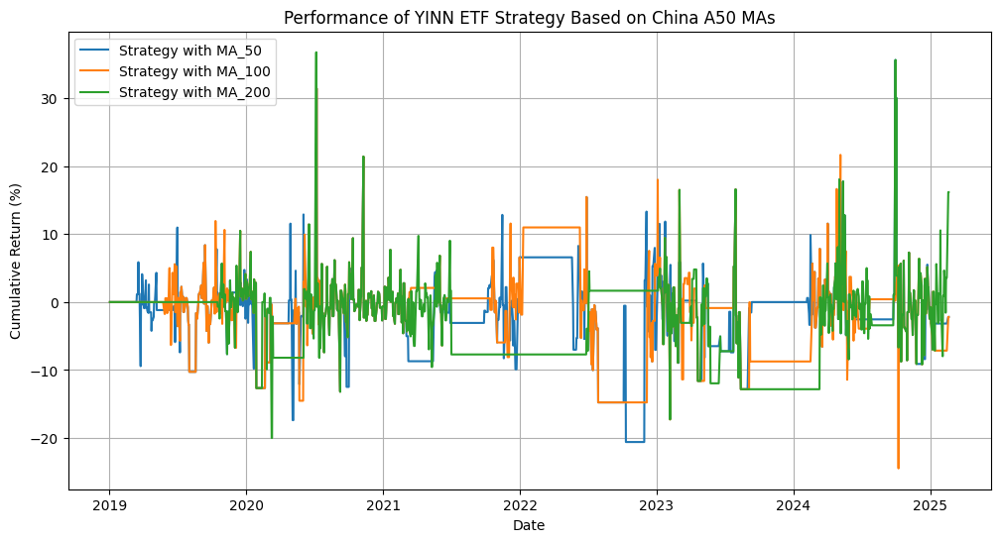

In [11]:
# Calculate cumulative returns for each strategy (if not already calculated)
for ma, df_copy in results.items():
    # Calculate daily returns from portfolio value
    df_copy['Daily_Return'] = df_copy['Portfolio_Value'].pct_change().fillna(0)
    # Calculate cumulative returns: cumulative product of (1 + daily return) minus 1
    df_copy['Cumulative_Return'] = (1 + df_copy['Daily_Return']).cumprod() - 1

# Create a table with buy/sell signals and portfolio performance for all three MA strategies
signal_data = []
for ma, df_copy in results.items():
    signals = df_copy[['Date', 'Signal', 'Trade_Price', 'Portfolio_Value']].copy()
    signals['Strategy'] = ma
    signal_data.append(signals)

# Combine all signals into a single DataFrame and sort
signals_df = pd.concat(signal_data).sort_values(by=['Date', 'Strategy'])

# Create a separate table with cumulative returns for all strategies
cumulative_return_data = []
for ma, df_copy in results.items():
    cumulative_returns = df_copy[['Date', 'Cumulative_Return']].copy()
    cumulative_returns['Strategy'] = ma
    cumulative_return_data.append(cumulative_returns)

# Combine all cumulative returns into a single DataFrame and sort
cumulative_returns_df = pd.concat(cumulative_return_data).sort_values(by=['Date', 'Strategy'])

# Write both DataFrames to a single Excel file with two sheets
with pd.ExcelWriter("combined_trading_data.xlsx") as writer:
    signals_df.to_excel(writer, sheet_name="Trading Signals", index=False)
    cumulative_returns_df.to_excel(writer, sheet_name="Cumulative Returns", index=False)

print("Excel file 'combined_trading_data.xlsx' has been created with both sheets.")

# Plot Cumulative Returns for Each MA Strategy
plt.figure(figsize=(12, 6))
for ma, df_copy in results.items():
    plt.plot(df_copy['Date'], df_copy['Cumulative_Return'] * 100, label=f"Strategy with {ma}")  # multiplied by 100 to show percentage

plt.xlabel("Date")
plt.ylabel("Cumulative Return (%)")
plt.title("Performance of YINN ETF Strategy Based on China A50 MAs")
plt.legend()
plt.grid()
plt.show()

# Volatility and Correlation Measure

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

In [ ]:
# Load the dataset
file_path = "YINN_A50_futures.xlsx"

# Load the "Combined" sheet
df = pd.read_excel(file_path, sheet_name="Combined")

# Ensure the date column is in datetime format
df['Date'] = pd.to_datetime(df['Date'])

Correlation coefficient: 0.594406370753056


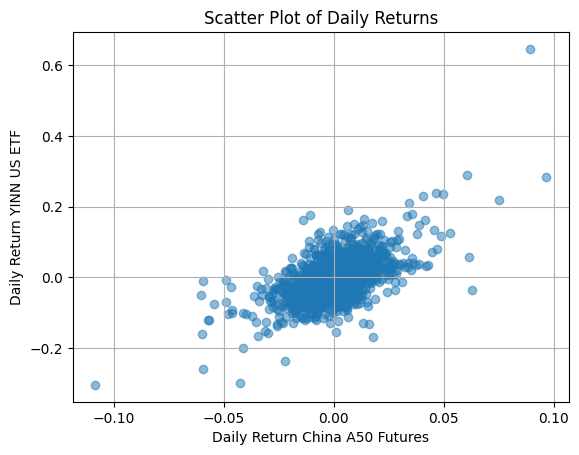

In [6]:
# Calculate returns for China A50 futures and YINN US
df['returnsA50'] = df['China A50 Price'].pct_change()
df['returnsYINN'] = df['YINN US Price'].pct_change()

correlation = df['returnsA50'].corr(df['returnsYINN'])
print("Correlation coefficient:", correlation)

# Optionally, create a scatter plot to visualize the relationship
plt.scatter(df['returnsA50'], df['returnsYINN'], alpha=0.5)
plt.xlabel('Daily Return China A50 Futures')
plt.ylabel('Daily Return YINN US ETF')
plt.title('Scatter Plot of Daily Returns')
plt.grid(True)
plt.show()

In [8]:
# Calculate returns for China A50 futures and YINN US
df['returnsA50'] = df['China A50 Price'].pct_change()
df['returnsYINN'] = df['YINN US Price'].pct_change()

# 1-month rolling volatility (annualized)
df['A50Volatility_1m'] = df['returnsA50'].rolling(window = 21).std() * np.sqrt(252)
df['YINNVolatility_1m'] = df['returnsYINN'].rolling(window = 21).std() * np.sqrt(252)

# 3-month rolling volatility (annualized)
df['A50Volatility_3m'] = df['returnsA50'].rolling(window = 63).std() * np.sqrt(252)
df['YINNVolatility_3m'] = df['returnsYINN'].rolling(window = 63).std() * np.sqrt(252)

# 6-month rolling volatility (annualized)
df['A50Volatility_6m'] = df['returnsA50'].rolling(window = 126).std() * np.sqrt(252)
df['YINNVolatility_6m'] = df['returnsYINN'].rolling(window = 126).std() * np.sqrt(252)

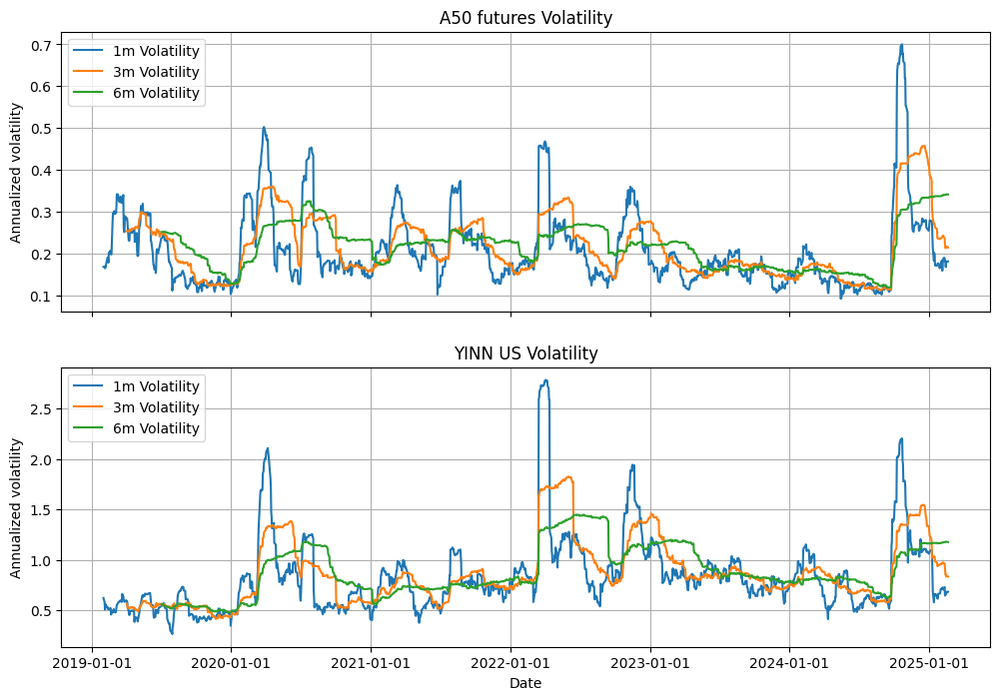

In [9]:
# Use dictionary structure to map each asset to its respective volatility column

#Define
volatility = {
    "A50 futures": {
        "1m": "A50Volatility_1m",
        "3m": "A50Volatility_3m",
        "6m": "A50Volatility_6m"
    },
    "YINN US": {
        "1m": "YINNVolatility_1m",
        "3m": "YINNVolatility_3m",
        "6m": "YINNVolatility_6m"
    }
}

#Create subplots for each asset
fig, axes = plt.subplots(len(volatility), 1, figsize=(12,8), sharex= True)

for ax, (asset, vol_dict) in zip(axes, volatility.items()):
    for period, col in vol_dict.items():
        ax.plot(df["Date"], df[col], label= f"{period} Volatility")
    ax.set_title(f"{asset} Volatility")
    ax.set_ylabel("Annualized volatility")
    ax.legend()
    ax.grid(True)

    # Set date formatter for the x-axis
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
    # Optionally, set the locator to show ticks at a desired interval (e.g., every month)
    ax.xaxis.set_major_locator(mdates.AutoDateLocator())

   # ax.set_xlim([df['Date'].min(), df['Date'].max()])

axes[-1].set_xlabel("Date")
plt.tight_layout
plt.show()

# GRAVEYARD

In [ ]:
# Revised Logic 1.0 for Fixed Notional Approach 
# (MA_100: execution at t+1; MA_200: execution at t)

initial_investment = 1000
results = {}

# Loop only over MA_100 and MA_200 (remove MA_50)
for ma in ['MA_100', 'MA_200']:
    df_copy = df.copy()
    df_copy.sort_values(by='Date', inplace=True)  # Ensure data is sorted chronologically

    # Initialize columns for strategy
    df_copy['Signal'] = 0         # 1 = Buy, -1 = Sell, 0 = Hold
    df_copy['Position'] = 0       # 1 = In Trade, 0 = Out of Trade
    df_copy['Trade_Price'] = np.nan   # Entry/Exit Price
    df_copy['Trailing_Stop'] = np.nan # Trailing Stop Price
    # For fixed notional approach the notional per trade remains constant (here $1000)
    df_copy['Portfolio_Value'] = initial_investment

    # For MA_100, we use pending order flags to execute at t+1.
    # For MA_200, we execute immediately on the same day.
    in_trade = False
    pending_buy = False       
    pending_buy_idx = None    
    pending_exit = False      
    pending_exit_idx = None   

    # Trade-specific variables
    trade_price = 0
    shares_held = 0
    trailing_stop = 0
    entry_date = None

    # Hold period (in days)
    hold_period = 3  # Subject to change

    # Loop over rows (using len(df_copy)-1 if t+1 is needed; for MA_200 we'll check current row)
    for i in range(len(df_copy) - 1):
        current_date = df_copy['Date'].iloc[i]
        current_close = df_copy['YINN US Price'].iloc[i]
        current_low = df_copy['YINN US Low'].iloc[i]
        current_high = df_copy['YINN US High'].iloc[i]
        current_open = df_copy['YINN US Open'].iloc[i]   # available open price for day i
        next_open = df_copy['YINN US Open'].iloc[i + 1]    # next day open

        print("\n---")
        print(f"Index: {i}, Date: {current_date}")
        print(f"Current Open: {current_open}, Close: {current_close}, Low: {current_low}, High: {current_high}")

        # === For MA_100 (t+1 execution) ===
        if ma == 'MA_100':
            # Execute pending BUY order on the next day
            if pending_buy and i == pending_buy_idx + 1:
                execution_price = next_open
                trade_price = execution_price
                cash_available = df_copy.at[i - 1, 'Portfolio_Value'] if i > 0 else initial_investment
                # Fixed notional always uses initial_investment per trade:
                shares_held = initial_investment / trade_price
                trailing_stop = trade_price * 0.90
                entry_date = df_copy['Date'].iloc[pending_buy_idx]
                df_copy.at[i, 'Signal'] = 1
                df_copy.at[i, 'Trade_Price'] = trade_price
                df_copy.at[i, 'Portfolio_Value'] = shares_held * trade_price
                in_trade = True
                pending_buy = False
                print(f"(MA_100) BUY EXECUTED at t+1: Trade Price = {trade_price}, Shares Held = {shares_held}, Trailing Stop = {trailing_stop}")
                print(f"Portfolio Value updated to {df_copy.at[i, 'Portfolio_Value']}")

            # Execute pending EXIT order on the next day
            if pending_exit and i == pending_exit_idx + 1:
                execution_price = next_open
                exit_price = execution_price
                trade_return = (exit_price - trade_price) / trade_price
                df_copy.at[i, 'Signal'] = -1
                df_copy.at[i, 'Trade_Price'] = exit_price
                df_copy.at[i, 'Trade_Return'] = trade_return
                df_copy.at[i, 'Portfolio_Value'] = shares_held * exit_price
                print(f"(MA_100) SELL EXECUTED at t+1: Exit Price = {exit_price}, Trade Return = {trade_return}, New Portfolio Value = {df_copy.at[i, 'Portfolio_Value']}")
                shares_held = 0
                in_trade = False
                pending_exit = False

            # Signal generation for MA_100: if not in trade or pending, flag a buy signal.
            if (not in_trade) and (not pending_buy):
                if df_copy['China A50 Price'].iloc[i] > df_copy[ma].iloc[i]:
                    print(f"(MA_100) BUY SIGNAL GENERATED at {current_date} for {ma}. China A50 Price = {df_copy['China A50 Price'].iloc[i]}, MA = {df_copy[ma].iloc[i]}")
                    pending_buy = True
                    pending_buy_idx = i
                    print(f"(MA_100) Pending BUY flagged at index {i}.")

        # === For MA_200 (t execution) ===
        elif ma == 'MA_200':
            # Immediate execution: When a buy signal is generated, execute on the same day.
            if (not in_trade) and (df_copy['China A50 Price'].iloc[i] > df_copy[ma].iloc[i]):
                print(f"(MA_200) BUY SIGNAL GENERATED at {current_date} for {ma}. China A50 Price = {df_copy['China A50 Price'].iloc[i]}, MA = {df_copy[ma].iloc[i]}")
                # Execute immediately using current day's open price
                trade_price = current_open
                shares_held = initial_investment / trade_price
                trailing_stop = trade_price * 0.90
                entry_date = current_date
                df_copy.at[i, 'Signal'] = 1
                df_copy.at[i, 'Trade_Price'] = trade_price
                df_copy.at[i, 'Portfolio_Value'] = shares_held * trade_price
                in_trade = True
                print(f"(MA_200) BUY EXECUTED: Trade Price = {trade_price}, Shares Held = {shares_held}, Trailing Stop = {trailing_stop}")
                print(f"Portfolio Value updated to {df_copy.at[i, 'Portfolio_Value']}")

            # In-trade processing for MA_200: update trailing stop and check for exit.
            if in_trade:
                old_trailing_stop = trailing_stop
                trailing_stop = max(trailing_stop, current_high * 0.90)
                if trailing_stop != old_trailing_stop:
                    print(f"(MA_200) Trailing Stop updated: Old = {old_trailing_stop}, New = {trailing_stop}")
                df_copy.at[i, 'Trailing_Stop'] = trailing_stop

                # Exit Condition 1: Stop-loss if current low falls below trailing stop.
                if current_low < trailing_stop:
                    # Execute exit immediately using current day's open
                    exit_price = current_open
                    trade_return = (exit_price - trade_price) / trade_price
                    df_copy.at[i, 'Signal'] = -1
                    df_copy.at[i, 'Trade_Price'] = exit_price
                    df_copy.at[i, 'Trade_Return'] = trade_return
                    df_copy.at[i, 'Portfolio_Value'] = shares_held * exit_price
                    print(f"(MA_200) SELL EXECUTED (Stop-Loss) at {current_date}: Exit Price = {exit_price}, Trade Return = {trade_return}, New Portfolio Value = {df_copy.at[i, 'Portfolio_Value']}")
                    shares_held = 0
                    in_trade = False

                # Exit Condition 2: MA exit after holding period
                elif (entry_date is not None and 
                      (df_copy['Date'].iloc[i] - entry_date).days >= hold_period and 
                      current_close < df_copy[ma].iloc[i] * 0.98):
                    exit_price = current_open
                    trade_return = (exit_price - trade_price) / trade_price
                    df_copy.at[i, 'Signal'] = -1
                    df_copy.at[i, 'Trade_Price'] = exit_price
                    df_copy.at[i, 'Trade_Return'] = trade_return
                    df_copy.at[i, 'Portfolio_Value'] = shares_held * exit_price
                    print(f"(MA_200) SELL EXECUTED (MA Exit) at {current_date}: Exit Price = {exit_price}, Trade Return = {trade_return}, New Portfolio Value = {df_copy.at[i, 'Portfolio_Value']}")
                    shares_held = 0
                    in_trade = False

        # ----- Portfolio Value Update -----
        # If no order is executed on this day, carry forward the previous day's portfolio value.
        if df_copy.at[i, 'Signal'] == 0:
            df_copy.at[i, 'Portfolio_Value'] = (df_copy.at[i - 1, 'Portfolio_Value'] if i > 0 else initial_investment)

        # Debug print for the iteration end:
        print(f"End of Index {i} Summary:")
        print(f"  In Trade: {in_trade}, Pending Buy: {pending_buy if ma=='MA_100' else 'N/A'}, Pending Exit: {pending_exit if ma=='MA_100' else 'N/A'}")
        print(f"  Trade Price: {trade_price}, Shares Held: {shares_held}")
        print(f"  Trailing Stop: {trailing_stop}")
        print(f"  Portfolio Value: {df_copy.at[i, 'Portfolio_Value']}")
        print("---")

    # For the final row, simply carry forward the last known portfolio value.
    df_copy.at[len(df_copy) - 1, 'Portfolio_Value'] = (df_copy.at[len(df_copy) - 2, 'Portfolio_Value'] if len(df_copy) > 1 else initial_investment)
    # Calculate returns and drawdowns
    df_copy['Daily_Return'] = df_copy['Portfolio_Value'].pct_change().fillna(0)
    df_copy['Cumulative_Return'] = (1 + df_copy['Daily_Return']).cumprod() - 1
    df_copy['Rolling_Max'] = df_copy['Portfolio_Value'].cummax()
    df_copy['Drawdown'] = df_copy['Portfolio_Value'] / df_copy['Rolling_Max'] - 1

    results[ma] = df_copy

           Date  Signal  Trade_Price  Portfolio_Value Strategy
0    2019-01-02       0          NaN      1000.000000    MA_10
0    2019-01-02       0          NaN      1000.000000   MA_100
0    2019-01-02       0          NaN      1000.000000   MA_120
0    2019-01-02       0          NaN      1000.000000   MA_150
0    2019-01-02       0          NaN      1000.000000    MA_20
...         ...     ...          ...              ...      ...
1539 2025-02-19       0          NaN      1000.000000   MA_120
1539 2025-02-19       0          NaN      1159.351412   MA_150
1539 2025-02-19       0          NaN      1000.000000    MA_20
1539 2025-02-19       0          NaN      1159.351412   MA_200
1539 2025-02-19       0          NaN      1000.000000    MA_50

[10780 rows x 5 columns]


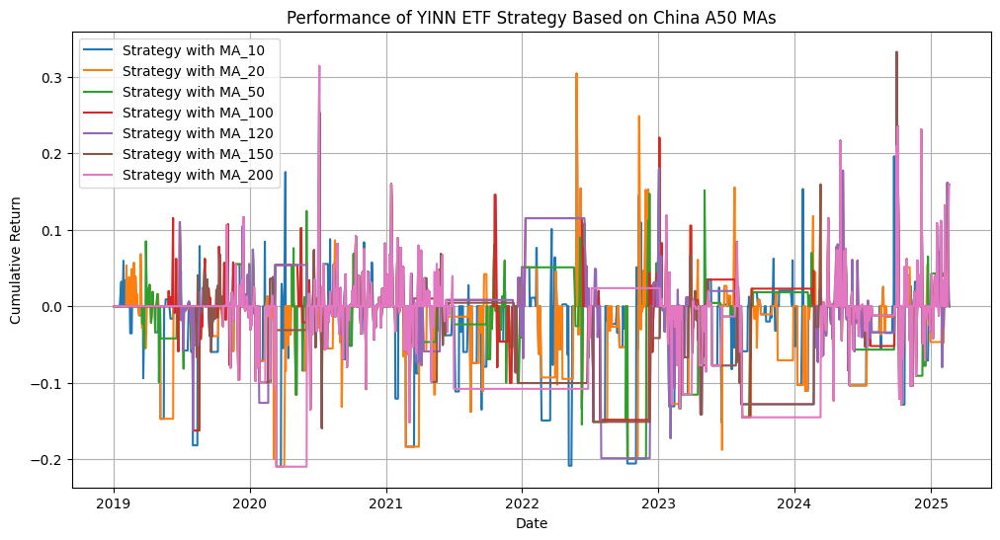

In [21]:

# Create a table with buy/sell signals and portfolio performance for all three MA strategies
signal_data = []

for ma, df_copy in results.items():
    signals = df_copy[['Date', 'Signal', 'Trade_Price', 'Portfolio_Value']].copy()
    signals['Strategy'] = ma
    signal_data.append(signals)

# Combine all signals into a single DataFrame
signals_df = pd.concat(signal_data).sort_values(by=['Date', 'Strategy'])

# Display the table
print(signals_df)
#signals_df.to_excel("trading_signals_26225 CA.xlsx", index=False)

# Plot Cumulative Returns for Each MA
plt.figure(figsize=(12, 6))
for ma, df_copy in results.items():
    plt.plot(df_copy['Date'], df_copy['Cumulative_Return'], label=f"Strategy with {ma}")

plt.xlabel("Date")
plt.ylabel("Cumulative Return")
plt.title("Performance of YINN ETF Strategy Based on China A50 MAs")
plt.legend()
plt.grid()
plt.show()